In [13]:
# Importing necessary libraries
import os
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import random
import copy
import shutil
import numpy as np
import ipywidgets as widgets
import wandb

In [14]:
# Installing ultralytics
!pip install ultralytics

In [15]:
# Importing YOLO
from ultralytics import YOLO

In [16]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("wandb_api")


In [17]:
wandb.login(key=secret_value_0)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [18]:
# Defining input images and masks path
ip_path='/kaggle/input'
train_images_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'train_val'
                               ,'images')
test_images_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'TEST'
                               ,'images')
train_masks_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'train_val'
                               ,'masks')
test_masks_path=os.path.join(ip_path,'semantic-segmentation-of-underwater-imagery-suim', 'TEST'
                               ,'masks')

In [19]:
# Defining output train,val and test paths
op_path='/kaggle/working'
op_labels_path=os.path.join(op_path, 'labels')
op_images_path=os.path.join(op_path, 'images')

op_images_trainpath=os.path.join(op_images_path, 'train')
op_images_valpath=os.path.join(op_images_path, 'val')
op_images_testpath=os.path.join(op_images_path, 'test')
op_labels_trainpath=os.path.join(op_labels_path, 'train')
op_labels_valpath=os.path.join(op_labels_path, 'val')
op_labels_testpath=os.path.join(op_labels_path, 'test')

os.makedirs(op_images_trainpath)
os.makedirs(op_images_valpath)
os.makedirs(op_images_testpath)
os.makedirs(op_labels_trainpath)
os.makedirs(op_labels_valpath)
os.makedirs(op_labels_testpath)

In [20]:
# Sorting images and masks
train_imgs_list=sorted(os.listdir(train_images_path))
train_masks_list=sorted(os.listdir(train_masks_path))

test_imgs_list=sorted(os.listdir(test_images_path))
test_masks_list=sorted(os.listdir(test_masks_path))

In [21]:
test_masks_list=list(filter (lambda x: x.endswith('bmp'), test_masks_list))

In [22]:
# Checking size of training images
total_images_train=len(train_imgs_list)
total_images_train

1525

In [23]:
# Checking size of test images
total_images_test=len(test_imgs_list)
total_images_test

110

In [24]:
def plot_image_and_mask():
    figure,axis = plt.subplots(1,2,figsize=(30,30))
    plt.axis('off')
    k=random.randint(0, total_images_train-1) # choosing any random image number
    
    img_path=os.path.join(train_images_path, train_imgs_list[k]) # defining image path
    mask_path=os.path.join(train_masks_path, train_masks_list[k]) # defining mask path
    
    img_title=os.path.basename(img_path) # extracting image filename from path
    mask_title=os.path.basename(mask_path) # extracting mask filename from path
    
    # displaying image and mask
    axis[0].imshow(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB))
    axis[0].set_title(img_title, fontsize=30)
    axis[0].set_xticks([])
    axis[0].set_yticks([])
    axis[1].imshow(cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB))
    axis[1].set_title(mask_title, fontsize=30)
    axis[1].set_xticks([])
    axis[1].set_yticks([])

    plt.tight_layout()
    plt.show()

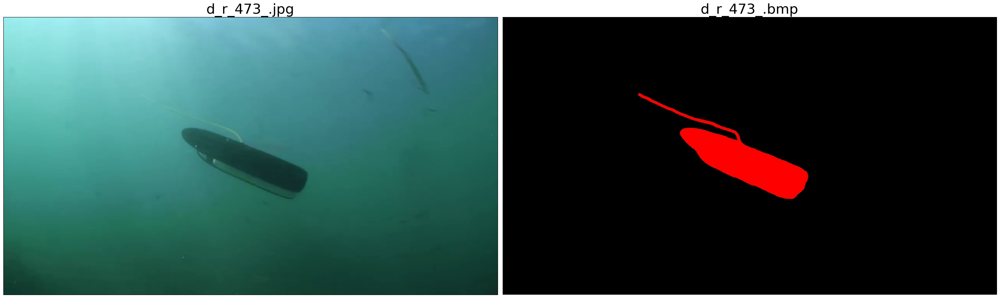

In [25]:
plot_image_and_mask()

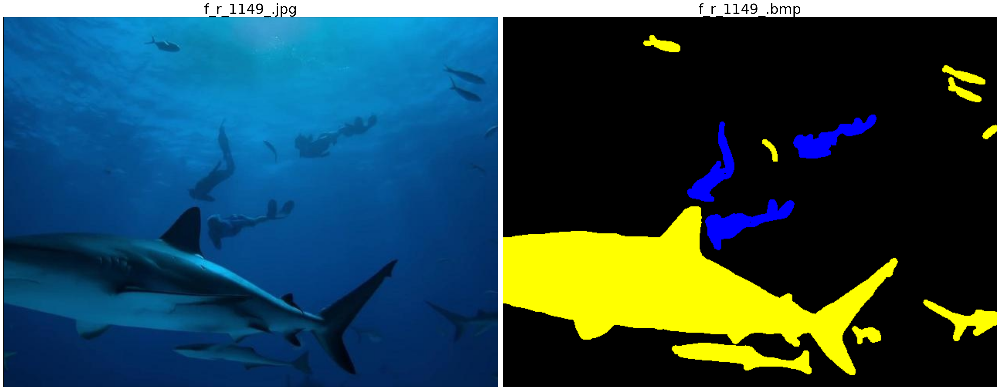

In [26]:
plot_image_and_mask()

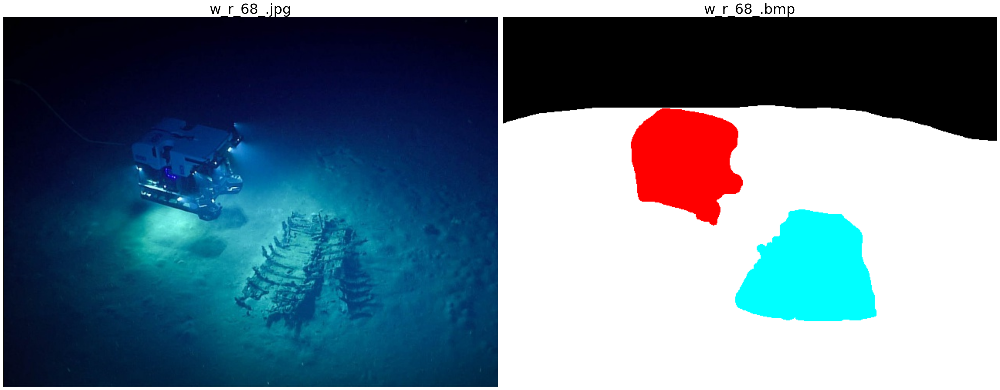

In [27]:
plot_image_and_mask()

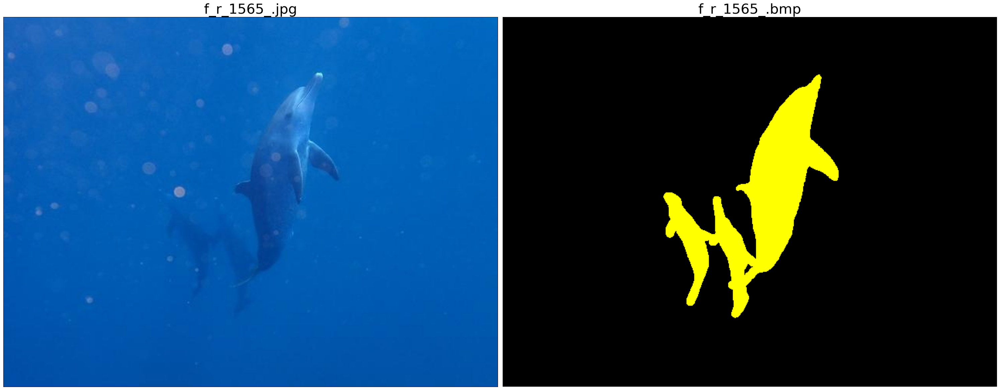

In [28]:
plot_image_and_mask()

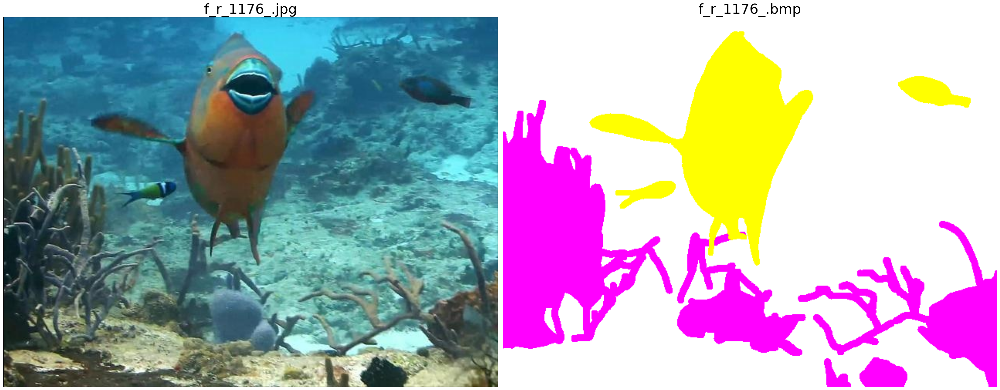

In [29]:
plot_image_and_mask()

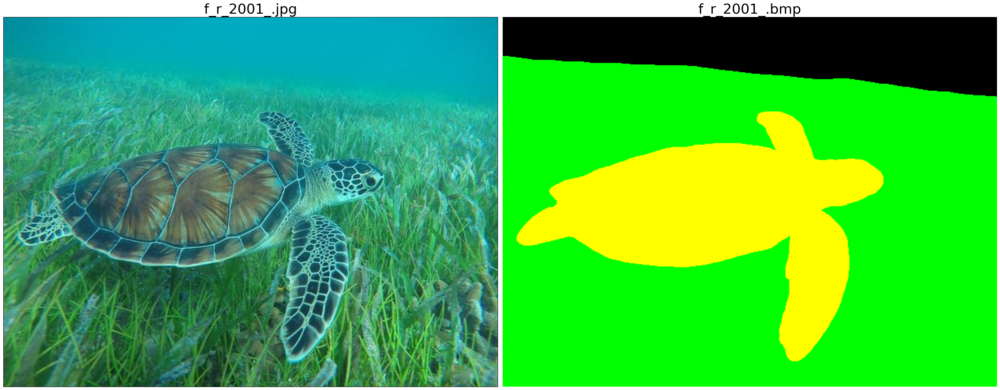

In [30]:
plot_image_and_mask()

In [31]:
# defining color-class mapping and color-name mapping
color_class_mapping={(0, 0, 0): 0,
                    (0, 0, 255): 1,
                    (0, 255, 0): 2,
                    (0, 255, 255): 3,
                    (255, 0, 0): 4,
                    (255, 0, 255): 5,
                    (255, 255, 0): 6,
                    (255, 255, 255): 7}

color_name_mapping={(0, 0, 0): 'black',
                    (0, 0, 255): 'blue',
                    (0, 255, 0): 'green',
                    (0, 255, 255): 'sky',
                    (255, 0, 0): 'red',
                    (255, 0, 255): 'pink',
                    (255, 255, 0): 'yellow',
                    (255, 255, 255): 'white'}

In [32]:
# defining orange color to draw contour on mask
orange=(255,85,0)

In [33]:
# function to draw contour around any random color present in the mask
def draw_contour_for_one_color_on_mask():
    figure,axis = plt.subplots(1,3,figsize=(30,30))
    plt.axis('off')
    k=random.randint(0, total_images_train-1) # choosing any random image
    
    img_path=os.path.join(train_images_path, train_imgs_list[k]) # defining image path
    img_title=os.path.basename(img_path) # extracting basename from path
    img=cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    
    mask_path=os.path.join(train_masks_path, train_masks_list[k]) # defining mask path
    mask_title=os.path.basename(mask_path) # extracting basename from path
    mask=cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)
    
    mask_copy=copy.deepcopy(mask) # creating a copy of mask to draw contour
    pixels = mask.reshape((-1, 3))
    unique_colors = np.unique(pixels, axis=0) # getting unique colors present in mask
    
    #getting only those unique colors which are defined in problem
    unique_colors_defined = [value for value in unique_colors if tuple(value) in color_class_mapping]
    unique_colors_defined = np.array(unique_colors_defined, dtype=np.uint8)
    total_colors=len(unique_colors_defined)
    j=random.randint(0, total_colors-1) # selecting any random color among all the defined colors present in mask
    color=unique_colors_defined[j]
    # defining title for contour on mask
    mask_copy_title=os.path.basename(mask_path)+' with contour on color ' +str(color_name_mapping[tuple(color)])
    
    mask_mask = cv2.inRange(mask, color, color) # getting mask of the selcted color on the mask-image
    contours, hrc = cv2.findContours(mask_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) # finding contours
    cv2.drawContours(mask_copy, contours, -1, orange, 4) # drawing contours
    
    axis[0].imshow(img) # displaying image
    axis[0].set_title(img_title, fontsize=30)
    axis[0].set_xticks([])
    axis[0].set_yticks([])
    axis[1].imshow(mask) # displaying mask 
    axis[1].set_title(mask_title, fontsize=30)
    axis[1].set_xticks([])
    axis[1].set_yticks([])
    axis[2].imshow(mask_copy) # displaying copy of mask with contour 
    axis[2].set_title(mask_copy_title, fontsize=30)
    axis[2].set_xticks([])
    axis[2].set_yticks([])

    plt.tight_layout()
    plt.show()

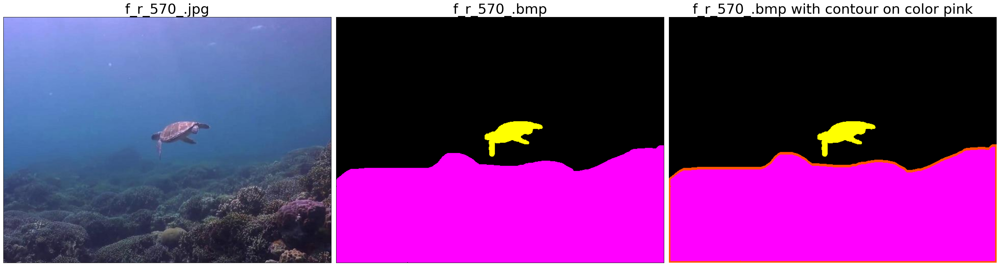

In [34]:
draw_contour_for_one_color_on_mask()

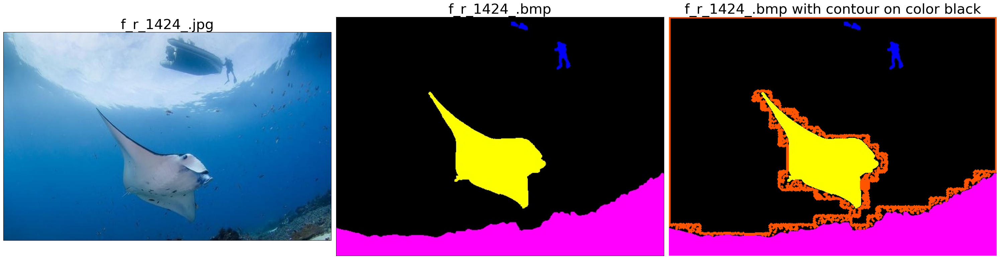

In [35]:
draw_contour_for_one_color_on_mask()

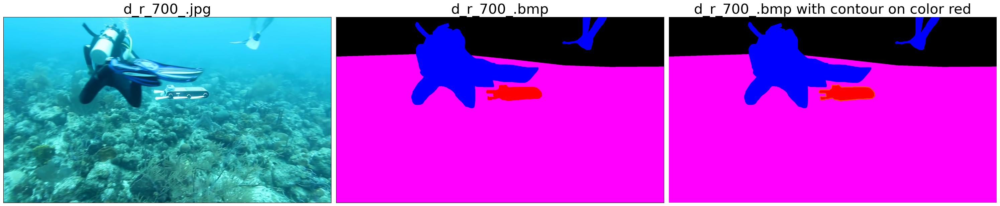

In [36]:
draw_contour_for_one_color_on_mask()

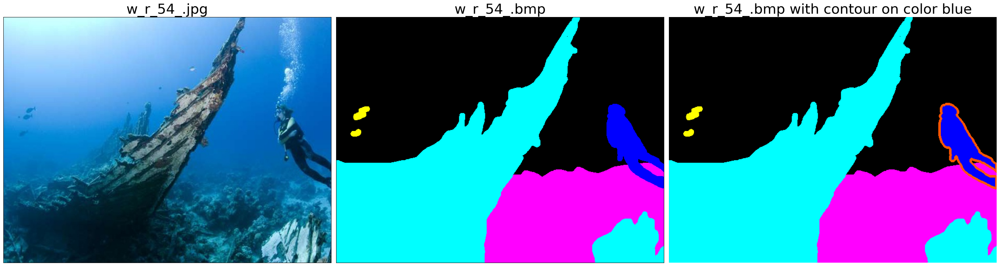

In [37]:
draw_contour_for_one_color_on_mask()

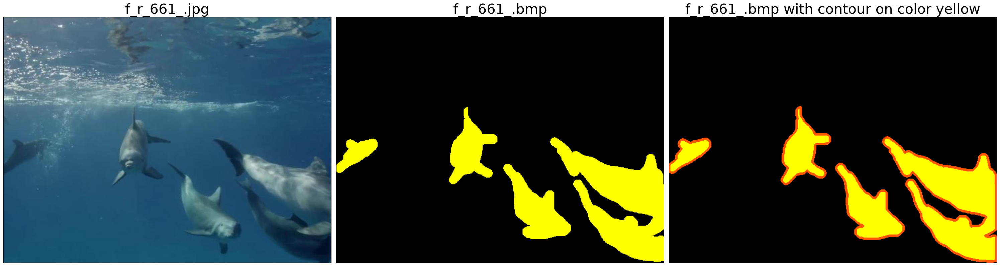

In [38]:
draw_contour_for_one_color_on_mask()

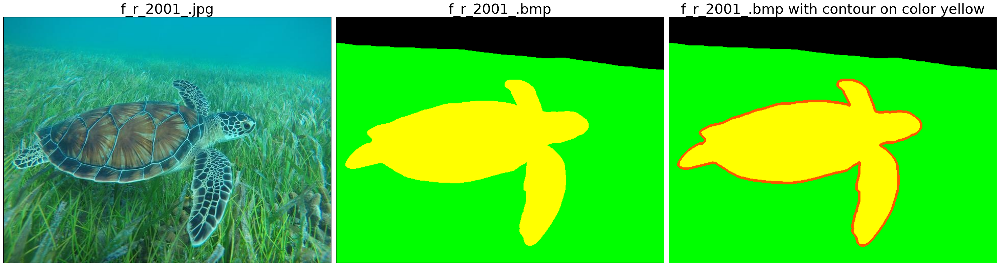

In [39]:
draw_contour_for_one_color_on_mask()

In [40]:
def write_polygon_file(class_contour_mapping, H, W, output_path, img_name):
    coordinates={}
    for obj in class_contour_mapping: # looping through all colors present in the mask
        polygons = []
        for cnt in class_contour_mapping[obj]: # looping through all contours present in the color
            if cv2.contourArea(cnt) > 20: # neglecting very small contours
                polygon = []
                for point in cnt: # looping through all points present in the contour
                    x, y = point[0]
                    polygon.append(round(x / W, 4))
                    polygon.append(round(y / H, 4))
                polygons.append(polygon)
        coordinates[obj]=polygons

    # creating text file for all contours of all colors present in mask
    with open('{}.txt'.format(os.path.join(output_path, img_name)), 'w') as f:
        for obj in coordinates:
            for polygon in coordinates[obj]:
                for p_, p in enumerate(polygon):
                    if p_ == len(polygon) - 1:  # if point is the last point in contour, need to give newline
                        f.write('{}\n'.format(p))
                    elif p_ == 0: # if point is the first point in contour, need to specify color also
                        f.write('{} {} '.format(obj, p))
                    else: # any other point between first and last
                        f.write('{} '.format(p))

In [41]:
# defining progress bar for visualising progress of writing text files
progress_bar=widgets.FloatProgress(value=0, min=0, max=100, description='Progress', 
                                   layout=widgets.Layout(width='100%'))
progress_bar

FloatProgress(value=0.0, description='Progress', layout=Layout(width='100%'))

In [42]:
m=0 # for counting total number of labels created

for img in train_masks_list:
    
    image=cv2.cvtColor(cv2.imread(os.path.join(train_masks_path,img)), cv2.COLOR_BGR2RGB)
    
    pixels = image.reshape((-1, 3))
    unique_colors = np.unique(pixels, axis=0) # getting unique colors present in mask
    
    #getting only those unique colors which are defined in problem
    unique_colors_defined = [value for value in unique_colors if tuple(value) in color_class_mapping]
    unique_colors_defined = np.array(unique_colors_defined, dtype=np.uint8)
    total_colors=len(unique_colors_defined)
        
    img_name=os.path.splitext(img)[0] # extracting mask name
    img_full_name=img_name+'.jpg' # getting image name corresponding to the extracted mask name

    img_path=os.path.join(train_images_path, img_full_name) # getting image path
    shutil.copy(img_path, op_images_trainpath) # copying image to output train path

    H,W,_=image.shape # extracting mask dimensions
    class_contour_mapping={}

    for i in range(total_colors): # looping through all colors present in mask
        color=unique_colors_defined[i] # extracting the color
        class_code=color_class_mapping[tuple(color)] # getting color-code
        mask = cv2.inRange(image, color, color) # getting mask of color on the mask-image
        contours, hrc = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) # finding contours
        class_contour_mapping[class_code]=contours # mapping color-code to contours
            
    # writing label text file    
    write_polygon_file(class_contour_mapping, H, W, op_labels_trainpath, img_name)
    m=m+1
    progress_bar.value=m/len(train_masks_list)*100    # updating progress bar
    
print("Total number of labels created: ", m)    

Total number of labels created:  1525


In [43]:
# Restarting the progress bar to track the progress of test label files creation
progress_bar.value=0
progress_bar

FloatProgress(value=0.0, description='Progress', layout=Layout(width='100%'))

In [44]:
m=0
for img in test_masks_list:
    
    image=cv2.cvtColor(cv2.imread(os.path.join(test_masks_path,img)), cv2.COLOR_BGR2RGB)
    
    pixels = image.reshape((-1, 3))
    unique_colors = np.unique(pixels, axis=0)
    unique_colors_defined = [value for value in unique_colors if tuple(value) in color_class_mapping]
    unique_colors_defined = np.array(unique_colors_defined, dtype=np.uint8)
    total_colors=len(unique_colors_defined)
    img_name=os.path.splitext(img)[0]
    img_full_name=img_name+'.jpg'

    img_path=os.path.join(test_images_path, img_full_name)
    shutil.copy(img_path, op_images_testpath)

    H,W,_=image.shape
    class_contour_mapping={}
    for i in range(total_colors):
        color=unique_colors_defined[i]
        class_code=color_class_mapping[tuple(color)]
        mask = cv2.inRange(image, color, color)
        contours, hrc = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        class_contour_mapping[class_code]=contours

    write_polygon_file(class_contour_mapping, H, W, op_labels_testpath, img_name)
    m=m+1
    progress_bar.value=m/len(test_masks_list)*100

    
print("Total number of labels created: ", m)   

Total number of labels created:  110


In [45]:
# function for creating validation dataset
def create_validation_data(dataset, size):
    random.shuffle(dataset)
    validation_data=dataset[:size]
    return validation_data
    

In [46]:
# creating validation dataset of size 110 from training dataset
validation_datalist=create_validation_data(train_imgs_list, 110)

In [47]:
for img in validation_datalist:
    imgsrc_path=os.path.join(op_images_trainpath, img)
    imgdst_path=os.path.join(op_images_valpath, img)
    shutil.move(imgsrc_path, imgdst_path)
    
    img_name=os.path.splitext(img)[0]
    label_file=img_name+'.txt'
    
    labelsrc_path=os.path.join(op_labels_trainpath,label_file)
    labeldst_path=os.path.join(op_labels_valpath,label_file)
    shutil.move(labelsrc_path, labeldst_path)

In [48]:
# defining newline variable for config file
newline='\n'

In [49]:
# defining lines of config text file

ln_1='# Train/val/test sets'+newline # starting with a comment line

# train, val and test path declaration
ln_2='train: ' +"'"+op_images_trainpath+"'"+newline
ln_3='val: ' +"'" + op_images_valpath+"'"+newline
ln_4='test: ' +"'" + op_images_testpath+"'"+newline
ln_5=newline

# names of the classes declaration
ln_6='names:'+newline
ln_7='  0: Background'+newline
ln_8='  1: Human divers'+newline
ln_9='  2: Aquatic plants and sea-grass'+newline
ln_10='  3: Wrecks and ruins'+newline
ln_11='  4: Robots'+newline
ln_12='  5: Reefs and invertebrates'+newline
ln_13='  6: Fish and vertebrates'+newline
ln_14='  7: Sea-floor and rocks'
config_lines=[ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8, ln_9, ln_10, ln_11, ln_12, ln_13, ln_14]

In [50]:
# Creating path for config file
config_path=os.path.join(op_path, 'config.yaml')
config_path

'/kaggle/working/config.yaml'

In [51]:
# Writing config file
with open(config_path, 'w') as f:
    f.writelines(config_lines)

In [52]:
# Choosing a YOLOv8 segmentation model for training with pretrained weights
model=YOLO('yolov8m-seg.yaml').load('yolov8m-seg.pt')

100%|██████████| 52.4M/52.4M [00:01<00:00, 44.0MB/s]


Transferred 537/537 items from pretrained weights


In [53]:
# Training the model; here degrees, shear and perspective are augmentation arguments
results=model.train(data=config_path, epochs=100, degrees=60, shear=30, perspective=0.0005, boxes=False)

WARNING ⚠️ 'boxes' is deprecated and will be removed in 'ultralytics 8.399999999999999' in the future. Please use 'show_boxes' instead.
Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.yaml, data=/kaggle/working/config.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, r

100%|██████████| 755k/755k [00:00<00:00, 4.03MB/s]
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file sy

Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

wandb: Currently logged in as: pradhanujan2003 (ujan2003). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 22.6MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/labels/train... 1415 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1415/1415 [00:07<00:00, 177.60it/s]


train: New cache created: /kaggle/working/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/labels/val... 110 images, 0 backgrounds, 0 corrupt: 100%|██████████| 110/110 [00:01<00:00, 101.31it/s]


val: New cache created: /kaggle/working/labels/val.cache
Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      9.39G      1.374      2.991      2.193      1.524        139        640: 100%|██████████| 89/89 [01:36<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.70it/s]

                   all        110       1079      0.575      0.326      0.305      0.199      0.544      0.309      0.278      0.154


AttributeError: module 'ray.train._internal.session' has no attribute '_get_session'

In [ ]:
# !zip -r results.zip /kaggle/working/runs/segment/train

In [ ]:
plt.figure(figsize=(30,30))
trainingresult_path=os.path.join(op_path, 'runs', 'segment', 'train')
results_png=cv2.imread(os.path.join(trainingresult_path,'results.png'))
plt.imshow(results_png)

In [ ]:
# function for evaluating model metrics map50
def evaluate_map50(trainedmodel, data_path, dataset='val'):
    metrics=trainedmodel.val(data=data_path, split=dataset)
    map50=round(metrics.seg.map50, 3)
    print("The mAP of model for all images on {0} dataset is {1}".format(dataset,map50))
    return metrics, map50

In [ ]:
   
# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50,50))
    
    #displaying mask p curve
    p_curve=cv2.imread(os.path.join(root_path,'MaskP_curve.png'))
    ax=plt.subplot(5,1,1)
    plt.imshow(p_curve)
    
    #displaying mask r curve
    r_curve=cv2.imread(os.path.join(root_path,'MaskR_curve.png'))
    ax=plt.subplot(5,1,2)
    plt.imshow(r_curve)
    
    #displaying mask pr curve
    pr_curve=cv2.imread(os.path.join(root_path,'MaskPR_curve.png'))
    ax=plt.subplot(5,1,3)
    plt.imshow(pr_curve)
    
    #displaying mask f1 curve
    f1_curve=cv2.imread(os.path.join(root_path,'MaskF1_curve.png'))
    ax=plt.subplot(5,1,4)
    plt.imshow(f1_curve)
    
    #displaying confusion matrix
    confusion_matrix=cv2.imread(os.path.join(root_path,'confusion_matrix.png'))
    ax=plt.subplot(5,1,5)
    plt.imshow(confusion_matrix)

In [ ]:
# Evaluating test metrics
test_metrics, test_map50=evaluate_map50(model, config_path, dataset='test')

In [ ]:
# Path storing model's performance on test dataset
test_path=os.path.join(op_path, 'runs', 'segment', 'val') #val is a misnomer, it is actually measuring validation on test dataset

In [ ]:
# Display plots on test data
display_curves(test_path) 

In [ ]:
plt.figure(figsize=(30,30))

for i in range(1,6,2):
    m=random.randint(0, len(test_imgs_list)) # Selecting random image number from test dataset
    test_image=os.path.join(op_images_testpath, os.listdir(test_images_path)[m])
    ax=plt.subplot(3,2,i)
    
    # Display actual image
    plt.imshow(cv2.cvtColor(cv2.imread(test_image), cv2.COLOR_BGR2RGB)) 
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)
    
    # Predict 
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(3,2,i+1)
    
    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])
